# LSST Solar System Processing

## Linking of Observations from JPL Veres & Chesley dataset via HelioLinC

### Algorithm: 

Based on HelioLinC (Holman et al. 2018) we transform topocentric observations to heliocentric states assuming a distance and radial velocity.
The resulting 3D positions are collected into tracklets. Tracklets contain at least two observations and can, thus, be used to create velocity vectors.
A tracklet + velocity vector is called an "arrow". 
Arrows are propagated to a common epoch using spiceypy's 2body propagator, and then clustered using dbscan.

### Implementation:
S. Eggl 20191215
    

In [1]:
# Solar System Processing functions
import lsstssp as ls

In [2]:


#Accelerators
import numpy as np
import numba

#Database
import pandas as pd
import sqlite3 as sql

# External API's
from astroquery.jplhorizons import Horizons
from astroquery.jplsbdb import SBDB

#Orbital Dynamics
import spiceypy as sp

#Interpolation
import scipy.interpolate as spi

# Clustering
import scipy.spatial as scsp
import sklearn.cluster as cluster

#Plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm

from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d

import plotly.graph_objects as go
import seaborn as sns
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 40, 'linewidths':0}

#Timing
import time
#%matplotlib inline


/epyc/projects/pytrax_play/envs/pytrax_s/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [3]:
def lsst_night(expMJD, minexpMJD):
    """Calculate the night for a given observation epoch and a survey start date.
    
    Parameters:
    -----------
    expMJD ... epoch of observation / exposure [modified Julian date, MJD]
    minexpMJD ... start date of survey [modified Julian date, MJD]
    
    Returns:
    --------
    night ... the night of a given observation epoch with respect to the survey start date.
    
    """
    local_midnight = 0.16
    const = minexpMJD + local_midnight - 0.5
    night = np.floor(expMJD - const)
    return night

In [4]:
def mjd2jd(mjd):
    """Transform modified Julian date to Julian date.
    
    Parameters:
    -----------
    mjd ... epoch [modified Julian date]
    
    
    Returns:
    --------
    jd ... epoch [Julian date]
    """
    jd = mjd+2400000.5
    return jd

In [5]:
def jd2mjd(jd):
    """Transform Julian date to modifiedJulian date.
    
    Parameters:
    -----------
    jd ... epoch [Julian date]
    
    Returns:
    --------
    mjd ... epoch [modified Julian date]
    """
    
    mjd=jd-2400000.5
    return mjd

In [23]:
jpl_data_path="/data/epyc/data/solarsystem/jpl/fullDensity_3months/jpl_fullDensity.db"

def grab_JPL_data(database,nrows):
    """Import JPL LSST Veres & Chesley dataset from local database
    
    Parameters:
    -----------
    database ... path to database
    nrows ... number of rows 
    
    Returns:
    --------
    observations ... pandas dataframe containing observations from JPL database
    """
    con = sql.connect(database)
    observations = pd.read_sql("""SELECT * FROM detections LIMIT """+str(nrows), con)
    
    return observations


def grab_n_days_of_JPL_data(database,tstart,tend):
    """Import JPL LSST Veres & Chesley dataset from local database
    
    Parameters:
    -----------
    database ... path to database
    tstart ... start night: number of nights since start of LSST survey (kraken2026) 
    tend ... last night: number of nights since start 
    
    Returns:
    --------
    observations ... pandas dataframe containing observations from JPL database
    """
    t0=52390
    
    if (tstart>tend):
        print('Start night must be before end night! ')
    
    else:
        qnights="nn <= " + str(t0+tend) + " AND nn >= " + str(t0+tstart)
        print(qnights)
        con = sql.connect(database)
        observations = pd.read_sql("""SELECT * FROM detections WHERE """+qnights, con)
    
    return observations
    

In [7]:
#obs=grab_n_days_of_JPL_data(jpl_data_path,0,7)

In [8]:
#obs

In [9]:
def plot_clusters(data, algorithm, args, kwds):
    """Cluster and plot data with skit learn algorithm """
    #start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    #end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    plt.figure(dpi=300)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=14)

In [10]:
def plot_clusters3d(data, dims, algorithm, args, kwds):
    """Cluster and plot multi dimensional data with skit learn algorithm
        Plotting is done in 3D only,"""
    #start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    #end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    
    fig=plt.figure(dpi=300,figsize=(20,14))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(data.T[dims[0]], data.T[dims[1]], data.T[dims[2]], c=colors)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    frame = plt.gca()
    #frame.axes.get_xaxis().set_visible(False)
    #frame.axes.get_yaxis().set_visible(False)
    
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=22)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)

In [11]:
def plot_orbits3d(df, xlims, ylims, zlims):
    """Orbit plot in 3D,"""
    palette = sns.color_palette('deep', np.unique(df['objId']).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in df['objId']]
    
    fig=plt.figure(dpi=300,figsize=(20,14))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(df['x'], df['y'], df['z'], c=colors)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    frame = plt.gca()

    if(xlims != []):
        ax.set_xlim(xlims[0],xlims[1])
    if(ylims != []):
        ax.set_ylim(ylims[0],ylims[1])
    if(zlims != []):
        ax.set_zlim(zlims[0],zlims[1])    
    
    plt.title('Orbits', fontsize=22)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)

In [12]:
def plot_positions3d(t,x,y,z,*args,**kwargs):
    """Plot x,y,z positions in 3D with color coding (time).
    
    Parameters:
    -----------
    t ... time array
    x ... array containing x coordinates
    y ... array containing t coordinates
    z ... array containing z coordinates
    
    Kwargs:
    -------
    xlim, ylim, zlim ... [min,max] ranges for x,y and z axes
    """
#t = dt[:]
#x, y, z = xp[:,0], xp[:,1], xp[:,2]

    options = {'xlim' : [], 'ylim' : [] }

    options.update(kwargs)

    data=[go.Scatter3d(x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=t,                # set color to an array/list of desired values
            colorscale='Viridis',   # choose a colorscale
            opacity=0.8
                    ))]

    layout = go.Layout(
        xaxis=dict(range=options['xlim']),
        yaxis=dict(range=options['ylim'])
 #       zaxis=dict(range=options['zlim'])
                  )

    fig = go.Figure(data=data, layout=layout)

# tight layout
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [13]:
# def metrics(df,pairs,cluster):
#     """Metrics for the succes of LSSTSSP arrow generation and clustering of SSO observations.
    
#     Parameters:
#     -----------
#     df      ... pandas dataframe with observations
#     pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
#     cluster ... output of clustering algorithm (sklearn.cluster)
    
#     Returns:
#     --------
#     n_obj               ... number of SSOs/asteroids in observations file 
#     n_clusters          ... number of clusters found by clustering algorithm (including garbage cluster with index -1)
#     perfect_clusters    ... fraction of perfect clusters that contain all observations of one object only 
#     pure_clusters       ... fraction of clusters that contain observations of one object 
#     impure_clusters     ... fraction of clusters that contain mised observations (more than one object)     
#     completeness        ... fraction of objects discovered
#     obj_not_found       ... list of objects not found 
#     unique_labels       ... unique cluster labels 
#     obj_in_cluster      ... list of objects in per cluster 
#     obs_in_cluster      ... list of observations in cluster
#     """
#     #cluster names (beware: -1 is the cluster of all the leftovers)
#     unique_labels = np.unique(cluster.labels_)
#     #number of clusters
#     n_clusters = len(unique_labels)
    
#     #which objects do observations in pairs (tracklets) belong to
#     p = np.array(pairs)              
#     pair_obj = np.array([df['obj'][p[:,0]].values,df['obj'][p[:,1]].values]).T
#     #which pairs (tracklets) belong to the same objects?
#     correct = correct_pairs(df,pairs)
#     #if a pair is correct pair_ok==1 otherwise 0
#     pair_ok = np.zeros(len(cluster.labels_))
#     pair_ok[correct] = 1

#     #group original observation dataframe by objects
#     gdf=df.groupby(['obj'])
    
#     #cluster contains all observations of one object
#     perfect_clusters =0 
#     #cluster contains observations of one object only
#     pure_clusters = 0
# #     #cluster contains all observations of one object + pollution
# #     valid_clusters = 0
#     #cluster contains all observations of more than one object
#     impure_clusters = 0
    
#     obs_in_cluster=[]
#     obs_in_cluster_add=obs_in_cluster.append
    
#     obj_in_cluster=[]
#     obj_in_cluster_add=obj_in_cluster.append
#     #cluster contains 
#     for u in unique_labels:
#         #which indices in pair array appear in a given cluster?
#         idx = np.where(cluster.labels_ == u)[0]
#         #find unique object ids in cluster
#         uniq_obj=np.unique(pair_obj[idx])
        
#         obj_in_cluster_add(uniq_obj)
        
#         #which observations are in this cluster
#         obs_in_cluster_add(np.unique(p[idx].flatten()))
        
#         if (np.sum(pair_ok[idx]) == len(idx)):
#             perfect_clusters += 1
#         elif (len(uniq_obj) == 1):
#             pure_clusters += 1 
#         elif (len(uniq_obj) > 1):
#             impure_clusters += 1 
        
#         if(uniq_obj)
         
        
#             #find unique observation ids in cluster
#             uniq_obs=np.rint(np.unique(p[idx]))
      
#             #find observation ids linked with objects
# #             valid=False
# #             for obj in uniq_obj:
# #                 #print(int(obj))
# #                 #obs_idx=gdf.indices[int(obj)+1]
# #                 obs_obj=gdf.indices[obj]
# #                 #print('obs_obj',obs_obj)
# #                 #print('uniq_obs',uniq_obs)
# # #                 print('***************')
# # #                 print('cluster',u,'obj', obj)
# # #                 print(np.isin(obs_obj,uniq_obs))
# # #                 print(all(np.isin(obs_obj,uniq_obs)))
# #                 if(all(np.isin(obs_obj,uniq_obs))):
# #                     valid=True
# #             if(valid):
# #                 valid_clusters += 1    
#     #number of unique found objects in clusters vs number of actual objects
#     #print((np.hstack(obj_in_cluster[1:])))
#     n_obj=len(gdf)
#     uoc=np.unique(np.hstack(obj_in_cluster[1:]))
#     completeness=len(uoc)/n_obj*100
#     #objects not found
#     obj_in_sample=list(gdf.indices.keys())
#     obj_not_found=np.ma.array(obj_in_sample, mask=np.isin(obj_in_sample,uoc))
    
#     return [n_obj, n_clusters, perfect_clusters, pure_clusters, impure_clusters, completeness, obj_not_found, unique_labels, obj_in_cluster, obs_in_cluster]                     


In [14]:
def correct_pairs(df,pairs):
    """Which pairs are actually good, i.e. which tracklets are real?
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    
    Returns:
    --------
    correct ... logical array (dimension of pairs[:,0])
    """
    p=np.array(pairs)
    #find out which pairs are actually good
    pair_obj=np.array([df['objId'][p[:,0]].values,df['objId'][p[:,1]].values]).T
    #print(pair_obj)
    #correct=np.where(df['obj'][p[:,0]].values == df['obj'][p[:,1]].values)
    correct=np.where(pair_obj[:,0] == pair_obj[:,1])
    return correct[0]

In [15]:
def observations_in_cluster(df,pairs,cluster):
    """List observations in each cluster.
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    cluster ... output of clustering algorithm (sklearn.cluster)
    
    Returns:
    --------
    obs_in_cluster ... list of observations in each cluster
    """
    #cluster names (beware: -1 is the cluster of all the leftovers)
    unique_labels = np.unique(cluster.labels_)
    #number of clusters
    n_clusters = len(unique_labels)
    
    #which objects do observations in pairs (tracklets) belong to
    p = np.array(pairs)              
    
    obs_in_cluster=[]
    obs_in_cluster_add=obs_in_cluster.append
    
    #cluster contains 
    for u in unique_labels:
        #which indices in pair array appear in a given cluster?
        idx = np.where(cluster.labels_ == u)[0]
        
        #which observations are in this cluster
        obs_in_cluster_add(np.unique(p[idx].flatten()))
    
    return obs_in_cluster, unique_labels

In [16]:
def objects_in_cluster(df,pairs,cluster):
    """List observations in each cluster.
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    cluster ... output of clustering algorithm (sklearn.cluster)
    
    Returns:
    --------
    obs_in_cluster ... list of objects in each cluster
    """
    #cluster names (beware: -1 is the cluster of all the leftovers)
    unique_labels = np.unique(cluster.labels_)
    #number of clusters
    n_clusters = len(unique_labels)
    
    #which objects do observations in pairs (tracklets) belong to
    p = np.array(pairs)              
    pair_obj = np.array([df['obj'][p[:,0]].values,df['obj'][p[:,1]].values]).T
    
    obj_in_cluster=[]
    obj_in_cluster_add=obj_in_cluster.append
    #cluster contains 
    for u in unique_labels:
        #which indices in pair array appear in a given cluster?
        idx = np.where(cluster.labels_ == u)[0]
        #find unique object ids in cluster
        uniq_obj=np.unique(pair_obj[idx])
        obj_in_cluster_add(uniq_obj)
        
    return obj_in_cluster, unique_labels

In [17]:
def observations_in_arrows(df,goodpairs,*args,**kwargs):
    """Find which observations go into an arrow.
    
    Parameters:
    -----------
    df          ... pandas dataframe with observations
    goodpairs   ... filtered list of pairs of observations [obsid1,obsid2] linked into arrows
    
    Returns:
    --------
    df_obs_in_arrows ... pandas dataframe where the index is the arrow id 
                         and the first and second column are the first and second observation 
                         that go into the respective arrow.
    """
    df_obs_in_arrows=pd.DataFrame(goodpairs,**kwargs)
    return df_obs_in_arrows

In [18]:
def df2difi(df,index_name,value_name):
    """Map pandas dataframe with lists of values to THOR difi format"""

    difi=df[value_name].apply(pd.Series) \
    .merge(df, right_index = True, left_index = True) \
    .drop([value_name], axis = 1) \
    .melt(id_vars = [index_name], value_name = value_name) \
    .drop("variable", axis = 1) \
    .dropna() \
    .sort_values(by=[index_name]) \
    .astype('int') \
    .reset_index(drop=True)
    
    return difi

## SIMULATED OBSERVATIONS 


1) Select observations from JPL Dataset

In [24]:
%%time
dfjpl=grab_n_days_of_JPL_data(jpl_data_path,0,13)

nn <= 52403 AND nn >= 52390


OperationalError: unable to open database file

2) Extract epochs of observations and query JPL Horizons for the corresponding observer states

In [20]:
def observer_states_from_horizons(epochs_of_observation, observer_location,tstart,tstop, ephemeris_dt='1h'):
    """Query JPL Horizons via astroquery to get sun-observer state vectors.
    
    Parameters:
    -----------
    observer_location  ... Horizons identifyer of observer location, e.g. 'I11'
    tstart             ... start time for ephemeris in Horizons format, e.g. 'JD2456789.5'
    tstop              ... end time for ephemeris in Horizons format, e.g. 'JD2456799.5'
    ephemeris_dt       ... Time step for ephemeris query. 
                           Typically 1h since the actual times will be interpolated later.
    
    Returns:
    --------
    observer_xyz       ... Heliocentric observer positions at gridded epochs in [au].
    observer_vxyz      ... Heliocentric observer velocities at gridded epochs in [au].
    observer_jd        ... Gridded ephemeris epochs (JD / TDB)
    
    External Function Requirements:
    -------------------------------
    # External API's
    from astroquery.jplhorizons import Horizons
    

    
    """
    try:
        # Get observer locations (caution: choose the right plane of reference and direction of the vectors!)
        # check query by copy/pasting the output of print(observer_sun.uri) into a webbrowser if there are problems.
        observer_sun=Horizons(id='Sun', location=observer_location, id_type='majorbody',
                      epochs={'start':tstart, 'stop':tstop,
                      'step':ephemeris_dt})

        xyz=observer_sun.vectors()['x','y','z']
        vxyz=(observer_sun.vectors())['vx','vy','vz']
        jd=(observer_sun.vectors())['datetime_jd']
        
        #We need the sun-observer vector not the observer-sun vector
        observer_xyz=(-1)*np.array([xyz['x'],xyz['y'],xyz['z']])
        observer_vxyz=(-1)*np.array([vxyz['vx'],vxyz['vy'],vxyz['vz']])
        observer_jd=np.array(jd)
        
    except:
        print("Error in observer_state_from_horizons: potential online ephemeris query failure.")
        raise
        
    return observer_jd,observer_xyz,observer_vxyz



In [21]:
def get_observer_states(observation_epochs,observer_location='I11',ephemeris_dt='1h'):
    """Produce sun-observer state vectors at observation epochs.
    
    Parameters:
    -----------
    observation_epochs         ... Numpy array of observation epochs [JD] 
    observer_location          ... Horizons identifyer of observer location, e.g. 'I11'
    ephemeris_dt               ... Time step for ephemeris query. 
                                   Typically 1h since the actual times will be interpolated later.
    
    Returns:
    --------
    observer_positions         ... Heliocentric observer positions at observation epochs in [au].
    
    
    External Function Requirements:
    -------------------------------

    # Interpolation
    import scipy.interpolate as spi
    
    # time transform
    mjd2jd                         ... change modified Julian date to Julian date, timescale TDB)
    
    # NASA JPL HORIZONS API call wrapper
    observer_states_from_horizons  ... Wrapper function for JPL Horizons state query via astropy
    
    """

    tmin = np.min(observation_epochs)
    tmax = np.max(observation_epochs)
    
    #Start and stop times of the survey
    tstart = 'JD'+str(tmin-1.)
    tstop = 'JD'+str(tmax+1.)

    epochs = np.unique(observation_epochs)


    [observer_jd,observer_xyz,observer_vxyz] = observer_states_from_horizons(observation_epochs,
                                                                             observer_location,
                                                                             tstart,tstop, ephemeris_dt)
        
    #Interpolate heliocentric observer positions to the actual observation epochs
    ir = spi.CubicHermiteSpline(observer_jd, observer_xyz,observer_vxyz, axis=1, extrapolate=None)
    observer_positions = ir(obs_epochs).T
    
    return observer_positions

In [22]:
#Observer location MPC code
observer_location='I11'
#Epochs of observation
obs_epochs=mjd2jd(dfjpl['epoch_mjd'].values)
#time between observations
ephemeris_dt='1h'

NameError: name 'dfjpl' is not defined

In [ ]:
observer_xyz=get_observer_states(obs_epochs,observer_location,ephemeris_dt)

In [ ]:
observer_xyz

In [ ]:
dfobs=dfjpl[['object_name','epoch_mjd','ra_deg','dec_deg']].rename(columns={'object_name':'obj','epoch_mjd':'time','ra_deg':'RA','dec_deg':'DEC'})
#epoch_mjd	ra_deg	ra_sigma_deg	dec_deg	dec_sigma_deg	mag	mag_sigma	filter_id	field_id	nn	object_name

In [ ]:
dfobs['x_obs']=observer_xyz[:,0]
dfobs['y_obs']=observer_xyz[:,1]
dfobs['z_obs']=observer_xyz[:,2]

In [ ]:
dfobs['night']=lsst_night(dfobs['time'],dfobs['time'].min()).astype('Int32')

In [ ]:
dfobs

In [ ]:
dfobs2=dfobs[dfobs['obj']!='FD']

In [ ]:
dfobs3=dfobs2[dfobs2['obj']!='NS']

In [ ]:
dfobs3

In [ ]:
dfobs3[dfobs3['obj'].isin((dfobs3.groupby('obj').count()>6).index)]

In [ ]:
value_counts = dfobs3["obj"].value_counts()

In [ ]:
value_counts.index

In [ ]:
dfobs4 = dfobs3[(dfobs3['obj'].isin(value_counts.index[value_counts.values >= 6].values))]

In [ ]:
dfobs4.groupby('obj').count()

In [37]:
dfobs=dfobs4

In [38]:
# Convert observations and observer states to pandas dataframe
# obsa=np.array(obs)
# dfradec=pd.DataFrame(np.hstack(obsa).T,columns=['objId','time','RA','DEC'])
# dfradec['objId']=dfradec['objId'].astype('int')
# dfxyz=pd.DataFrame(obsxyz.data,columns=['x','y','z'])*(-1)
# dfxyz2=dfxyz
# for i in range(len(asteroids)):
#        dfxyz2=pd.concat([dfxyz2,dfxyz])

In [39]:
# dfxyz2.reset_index(drop=True);

In [40]:
# dfobs=(dfradec.join(dfxyz2.reset_index(drop=True))).rename(columns={'x':'x_obs','y':'y_obs','z':'z_obs'})

## If LSST observations are used from file uncomment the following cell:

In [41]:
#dfobs=pd.read_csv('../data/lsst_sso_534_obs.tar.gz',sep='\s+',nrows=1200)

In [42]:
# check observation dataframe: must contain time, RA, DEC, x_obs, y_obs, z_obs
dfobs[0:10]

,obj,time,RA,DEC,x_obs,y_obs,z_obs,night
12,S100exq4a,52391.002282,168.957794,-14.033535,-0.808597,-0.599239,-0.000026,0
13,S100aS6Pa,52391.002282,171.254072,-12.079152,-0.808597,-0.599239,-0.000026,0
16,S1003qzRa,52391.002282,169.235740,-11.825341,-0.808597,-0.599239,-0.000026,0
18,S1007x0La,52391.002282,169.050901,-12.707862,-0.808597,-0.599239,-0.000026,0
19,S10007OPa,52391.002282,171.108553,-11.824220,-0.808597,-0.599239,-0.000026,0
22,S100dDwZa,52391.002282,168.926445,-13.595774,-0.808597,-0.599239,-0.000026,0
23,S1001Kfha,52391.002282,171.105427,-13.838795,-0.808597,-0.599239,-0.000026,0
28,S1004yK1a,52391.002282,169.299604,-14.421767,-0.808597,-0.599239,-0.000026,0
29,S100eRtea,52391.002282,169.522671,-11.992092,-0.808597,-0.599239,-0.000026,0
35,S1000mS6a,52391.002282,168.655308,-13.669400,-0.808597,-0.599239,-0.000026,0


In [43]:
dfobs.keys()
# should be Index(['obj', 'time', 'RA', 'DEC', 'x_obs', 'y_obs', 'z_obs'], dtype='object')

Index(['obj', 'time', 'RA', 'DEC', 'x_obs', 'y_obs', 'z_obs', 'night'], dtype='object')

In [44]:
dfobs['obsId']=dfobs.index

/epyc/projects/pytrax_play/envs/pytrax_s/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
dfobs[0:10]

,obj,time,RA,DEC,x_obs,y_obs,z_obs,night,obsId
12,S100exq4a,52391.002282,168.957794,-14.033535,-0.808597,-0.599239,-0.000026,0,12
13,S100aS6Pa,52391.002282,171.254072,-12.079152,-0.808597,-0.599239,-0.000026,0,13
16,S1003qzRa,52391.002282,169.235740,-11.825341,-0.808597,-0.599239,-0.000026,0,16
18,S1007x0La,52391.002282,169.050901,-12.707862,-0.808597,-0.599239,-0.000026,0,18
19,S10007OPa,52391.002282,171.108553,-11.824220,-0.808597,-0.599239,-0.000026,0,19
22,S100dDwZa,52391.002282,168.926445,-13.595774,-0.808597,-0.599239,-0.000026,0,22
23,S1001Kfha,52391.002282,171.105427,-13.838795,-0.808597,-0.599239,-0.000026,0,23
28,S1004yK1a,52391.002282,169.299604,-14.421767,-0.808597,-0.599239,-0.000026,0,28
29,S100eRtea,52391.002282,169.522671,-11.992092,-0.808597,-0.599239,-0.000026,0,29
35,S1000mS6a,52391.002282,168.655308,-13.669400,-0.808597,-0.599239,-0.000026,0,35


In [46]:
df1=dfobs['obj'].unique()


In [47]:
#Making numerical categories from object data
dfobs['objId']=dfobs.obj.astype('category').cat.codes

/epyc/projects/pytrax_play/envs/pytrax_s/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [48]:
#save a csv output 
#df.to_csv('observations_database.csv')

### Let's build our KDTree and create arrows 


Run a quick test to see if the arrow generation was successul:

In [49]:
df_grouped_by_night=dfobs.groupby('night')

In [50]:
len(df_grouped_by_night.groups)

3

In [125]:
#r=2.6
#drdt=-0.0001
cr=0.0005
#cr=0.005/180*np.pi*2
# max temporal separation for tracklet observations (days)
ct_max=8/24
# min temporal separation for tracklet observations, e.g. exposure time (days)
ct_min=30/86400 


#use astrometric uncertainty to determine clustering error (150mas (3sigma) )
#astrometric_uncertainty=300/1000/3600/180*np.pi

# DBSCAN clustering parameters
#eps=astrometric_uncertainty*r

eps=0.0001
min_samples=3

In [126]:
cr

0.0005

In [127]:
# %%time
# [xarrow, varrow, tarrow, goodpairs]=ls.create_heliocentric_arrows(df,r,drdt,tref,cr,ct,lttc=False,filtering=True,verbose=True,eps=cr/3)

In [128]:
%%time
# range of heliocentric radii
rall=np.arange(2,3.1,0.1)
#rall=[2.5]
# range of heliocentric radial velocities
#drdtall=np.arange(-0.01,0.01,0.005)
drdtall=[-0.0001]

clusters_df=[]

for r in rall:
    print('r=',r)
    for drdt in drdtall:
        print('dr/dt=',drdt)
        xar=[]
        var=[]
        tar=[]
        obsids_night=[]
    
        # the following two arrays are for testing purposes only
        objid_night=[]
        tobs_night=[]

        for n in range(len(df_grouped_by_night.groups)):
            print('Processing night ',n)
            # SELECT NIGHT FROM OBSERVATIONS DATA BASE
            idx=df_grouped_by_night.groups[n].values
            df=dfobs.loc[idx,:].reset_index(drop=True)
            tref=df['time'].median()

            # GENERATE ARROWS / TRACKLETS FOR THIS NIGHT
            [xarrow_night, 
             varrow_night, 
             tarrow_night, 
             goodpairs_night]=ls.create_heliocentric_arrows(df,r,drdt,tref,cr,ct_min,
                                                            ct_max,v_max=0.4,lttc=False,
                                                            filtering=True,verbose=True,eps=cr/3)
    
            # ADD TO PREVIOUS ARROWS
            xar.append(xarrow_night)
            var.append(varrow_night)
            tar.append(tarrow_night)
            obsids_night.append(df['obsId'].values[goodpairs_night])
            objid_night.append(df['objId'].values[goodpairs_night])
            tobs_night.append(df['time'].values[goodpairs_night])

        xarrow=np.vstack(xar)
        varrow=np.vstack(var)
        tarrow=np.hstack(tar)
        obsids=np.vstack(obsids_night)
        
        # the following two arrays are for testing purposes only
        objids=np.vstack(objid_night)
        tobs=np.vstack(tobs_night)
        
        # PROPAGATE ARROWS TO COMMON EPOCH
        print('Propagating arrows...')
        tprop=(dfobs['time'].max()-dfobs['time'].min())*0.5+dfobs['time'].min()
        #tprop=dfobs['time'].max()+180
        [xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,tprop)
        #[xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,dfobs['time'].max()+360)
     
        rnorm=(r/ls.norm(vp))
        vpn=vp*np.array([rnorm,rnorm,rnorm]).T
        xpvp=np.hstack([xp,vpn])
    
#       # CLUSTER WITH DBSCAN
#       # CLUSTER PROPAGATED STATES (HERE IN REAL SPACE, BUT COULD BE PHASE SPACE)
        print('Clustering arrows...')
        db=cluster.DBSCAN(eps=eps,min_samples=min_samples,n_jobs=4).fit(xp)
     
#       # CONVERT CLUSTER INDICES TO OBSERVATION INDICES IN EACH CLUSTER
        obs_in_cluster, labels = observations_in_cluster(dfobs,obsids,db)
        obs_in_cluster_df=pd.DataFrame(zip(labels,obs_in_cluster),columns=['clusterId','obsId'])
        
        # CLUSTER WITH KDTree
#         print('Clustering arrows...')
#         tree = scsp.KDTree(xp)
#         db = tree.query(xp, k=8, p=2, distance_upper_bound=eps)
    
#         print('Deduplicating observations in clusters...')
#         obs = []
#         obs_app = obs.append
#         arrow_idx = np.array(db,dtype="int64")[1]
#         nan_idx = arrow_idx.shape[0]
#         for i in arrow_idx:
#             entries = i[i<nan_idx]
#             if(len(entries)) > 1:
#                  obs_app([np.unique(np.ravel(obsids[entries]))])

#         obs_in_cluster_df = pd.DataFrame(obs,columns=['obsId'])
#         obs_in_cluster_df['clusterId']=obs_in_cluster_df.index.values
#         obs_in_cluster_df=obs_in_cluster_df[['clusterId','obsId']]
        
        #COMMON CODE
        obs_in_cluster_df['r'] = r
        obs_in_cluster_df['drdt'] = drdt
        
        clusters_df.append(obs_in_cluster_df)

# # GENERATE FINAL DATAFRAME WITH CLUSTERING RESULTS        
clustered_observations = pd.concat(clusters_df)        
    

r= 2.0
dr/dt= -0.0001
Processing night  0
Heliocentric positions generated.
Building spacial KDTree...
KDTree generated. Creating tracklets...
Tracklet candidates found: 32505
Filtering arrows by time between observations...
Tracklets filtered. New number of tracklets: 32259
Filtering arrows by max velocity..
lenx_filtered 32141
lenv_filtered 32141
lent_filtered 32141
x [[-1.10412789 -1.58676977 -0.51284504]
 [-1.10412789 -1.58676977 -0.51284504]
 [-1.10412789 -1.58676977 -0.51284504]
 ...
 [ 0.43395194 -1.8246223  -0.69458459]
 [ 0.43369345 -1.82106452 -0.70401889]
 [ 0.43628012 -1.82131956 -0.70175729]]
v [[ 0.00938473 -0.00797715  0.00408708]
 [ 0.00929133 -0.00770419  0.00344375]
 [ 0.00949528 -0.00780977  0.00333184]
 ...
 [ 0.01017435  0.00068601  0.00426758]
 [ 0.00692978 -0.00045558  0.0051639 ]
 [ 0.00909764 -0.00035612  0.00629626]]
t [52391.173182 52391.173182 52391.173182 ... 52391.327813 52391.327813
 52391.327813]
goodpairs [[ 1130  1492]
 [ 1130  1724]
 [ 1130  2431]
 ..

Heliocentric positions generated.
Building spacial KDTree...
KDTree generated. Creating tracklets...
Tracklet candidates found: 184372
Filtering arrows by time between observations...
Tracklets filtered. New number of tracklets: 179008
Filtering arrows by max velocity..
lenx_filtered 177582
lenv_filtered 177582
lent_filtered 177582
x [[-1.8761137  -1.05507812 -0.45498084]
 [-1.87699013 -1.0534818  -0.45498981]
 [-1.87691759 -1.05361401 -0.45498913]
 ...
 [ 0.8455487  -1.80355528 -0.93398766]
 [ 0.8455487  -1.80355528 -0.93398766]
 [ 0.84555093 -1.80355583 -0.9339847 ]]
v [[ 5.60778060e-03 -1.01951289e-02  3.79294912e-05]
 [ 5.62099168e-03 -1.02563407e-02  8.11998440e-05]
 [ 5.60132752e-03 -1.02264699e-02  9.50732986e-05]
 ...
 [ 5.01427954e-03 -1.21642130e-03  6.65288680e-03]
 [ 7.44573404e-03 -1.98315099e-05  6.54349080e-03]
 [ 9.85552751e-03  1.16609825e-03  6.43506938e-03]]
t [52393.163769 52393.008295 52393.021111 ... 52393.384682 52393.384682
 52393.385127]
goodpairs [[ 60378  653

Heliocentric positions generated.
Building spacial KDTree...
KDTree generated. Creating tracklets...
Tracklet candidates found: 42893
Filtering arrows by time between observations...
Tracklets filtered. New number of tracklets: 42483
Filtering arrows by max velocity..
lenx_filtered 42363
lenv_filtered 42363
lent_filtered 42363
x [[-2.20590654 -1.14623666 -0.26477783]
 [-2.20766385 -1.14235453 -0.2669006 ]
 [-2.20794695 -1.14142948 -0.26851158]
 ...
 [ 0.96124192 -2.30633624 -0.08313608]
 [ 0.96124192 -2.30633624 -0.08313608]
 [ 0.96124548 -2.30633498 -0.08313125]]
v [[ 0.00523792 -0.01131849  0.00442259]
 [ 0.00519621 -0.01086142  0.00257614]
 [ 0.00533161 -0.01102188  0.0020866 ]
 ...
 [ 0.00792997  0.00280928  0.01074763]
 [ 0.00956309  0.00359055  0.00796452]
 [ 0.00965238  0.00363327  0.00781235]]
t [52392.19728  52392.19728  52392.19728  ... 52392.387334 52392.387334
 52392.387783]
goodpairs [[ 5363 12777]
 [ 5035 12469]
 [ 5262 12684]
 ...
 [25153 25154]
 [25153 25394]
 [25154 25

Clustering arrows...
r= 2.8000000000000007
dr/dt= -0.0001
Processing night  0
Heliocentric positions generated.
Building spacial KDTree...
KDTree generated. Creating tracklets...
Tracklet candidates found: 29947
Filtering arrows by time between observations...
Tracklets filtered. New number of tracklets: 29834
Filtering arrows by max velocity..
lenx_filtered 29770
lenv_filtered 29770
lent_filtered 29770
x [[-1.31580119 -2.29300293 -0.92235025]
 [-1.31580119 -2.29300293 -0.92235025]
 [-1.31580119 -2.29300293 -0.92235025]
 ...
 [ 1.0181983  -2.39262789 -1.03856441]
 [ 1.02067869 -2.39438457 -1.03206085]
 [ 1.01948551 -2.39036521 -1.04250442]]
v [[ 0.00909998 -0.00705625  0.00425681]
 [ 0.00899068 -0.00660274  0.00328556]
 [ 0.00901822 -0.00671199  0.00351774]
 ...
 [ 0.00764747 -0.00010405  0.00746826]
 [ 0.01245769  0.0021575   0.00704479]
 [ 0.01535435  0.00376339  0.00611924]]
t [52391.172737 52391.172737 52391.172737 ... 52391.327813 52391.327813
 52391.327813]
goodpairs [[ 1007  111

Heliocentric positions generated.
Building spacial KDTree...
KDTree generated. Creating tracklets...
Tracklet candidates found: 168011
Filtering arrows by time between observations...
Tracklets filtered. New number of tracklets: 165927
Filtering arrows by max velocity..
lenx_filtered 165409
lenv_filtered 165409
lent_filtered 165409
x [[-2.59756955 -1.27488603 -0.79204121]
 [-2.59798274 -1.27404848 -0.79199102]
 [-2.59993785 -1.27487289 -0.78425351]
 ...
 [ 1.52174997 -2.20522525 -1.34958917]
 [ 1.52174997 -2.20522525 -1.34958917]
 [ 1.52200363 -2.20515492 -1.34942273]]
v [[ 0.00367201 -0.00744438 -0.00043796]
 [ 0.00367235 -0.00743804 -0.00045903]
 [ 0.00314135 -0.00950533  0.00465666]
 ...
 [ 0.01200984  0.00334028  0.00786332]
 [ 0.0120024   0.00332781  0.00787526]
 [ 0.01236256  0.00393097  0.00729757]]
t [52393.215848 52393.103197 52393.215848 ... 52393.384236 52393.384236
 52393.40537 ]
goodpairs [[ 75710  85722]
 [ 34289  42577]
 [ 75747  85759]
 ...
 [119446 120366]
 [119446 120

In [55]:
# DROP DUPLICATE CLUSTERS
clustered_observations_final=clustered_observations.iloc[clustered_observations.astype(str).drop_duplicates(subset='obsId', keep="first").index]    

In [56]:
#clustered_observations.iloc[clustered_observations.astype(str).drop_duplicates(subset='obsId', keep="first").index].count()

In [57]:
len(clustered_observations)

249481

In [58]:
len(clustered_observations_final)

41618

In [59]:
len(dfobs)

163543

In [60]:
len(obsids)

235644

In [61]:
obsids.max()

5659026

In [62]:
len(xp)

235644

In [63]:
tobs

array([[52391.181767, 52391.182215],
       [52391.181767, 52391.186831],
       [52391.182215, 52391.186831],
       ...,
       [52393.384236, 52393.405816],
       [52393.384236, 52393.40537 ],
       [52393.40537 , 52393.405816]])

In [64]:
(dfobs['time'].max()-dfobs['time'].min())*0.5+dfobs['time'].min()

52392.2128315

In [65]:
#set_diff_df = pd.concat([clustered_observations.astype(str), clustered_observations_final.astype(str), clustered_observations_final.astype(str)]).drop_duplicates(keep=False)

In [66]:
#set_diff_df

In [67]:
#dup_idx=np.where(clustered_observations.astype(str).duplicated(subset='obsId',keep='first'))[0]

In [68]:
#clustered_observations.iloc[dup_idx]

In [69]:
clustered_observations_final

,clusterId,obsId,r,drdt
0,-1,"[23, 88, 92, 102, 126, 144, 151, 172, 7573, 99...",2.0,-0.0001
1,0,"[378329, 378438, 378486, 378511, 384004, 38410...",2.0,-0.0001
2,1,"[378364, 384039, 384117, 389610, 389663, 40855...",2.0,-0.0001
3,2,"[378503, 384187, 389713, 408644, 408705, 41139...",2.0,-0.0001
4,3,"[378524, 389728, 408728, 411479, 433501, 43635...",2.0,-0.0001
...,...,...,...,...
21848,21847,"[4341138, 4437597, 4949305, 5018847, 5046814, ...",2.0,-0.0001
21921,21920,"[3765369, 3817149, 4992489, 5060925, 5139049, ...",2.0,-0.0001
21997,21996,"[3767807, 3814951, 3828735, 5068235, 5070701, ...",2.0,-0.0001
22133,22132,"[4313701, 4316650, 4316692, 4406889, 4410099, ...",2.0,-0.0001


## DIFI output

In [70]:
#clustered_observations_final.to_csv('LSST_SSP_DIFI_NONOISE_3days.txt',sep=' ',index=False)


In [71]:
#dfobs.to_csv('VC_NONOISE_3days.obs',sep=' ',index=False)

In [72]:
#observations in each cluster
# obs_in_cluster, labels = observations_in_cluster(dfobs,obsids,db)

# obs_in_cluster_df=pd.DataFrame(zip(labels,obs_in_cluster),columns=['clusterId','obsId'])

## Plots

In [73]:
# #object(s) in each cluster
# obj_in_cluster, labels=objects_in_cluster(dfobs,objids,db)

# labels

# obj_in_cluster_df=pd.DataFrame(zip(labels,obj_in_cluster), columns=['clusterId','objId'])

# obj_in_cluster_df

Plot the arrow positions for the test asteroids

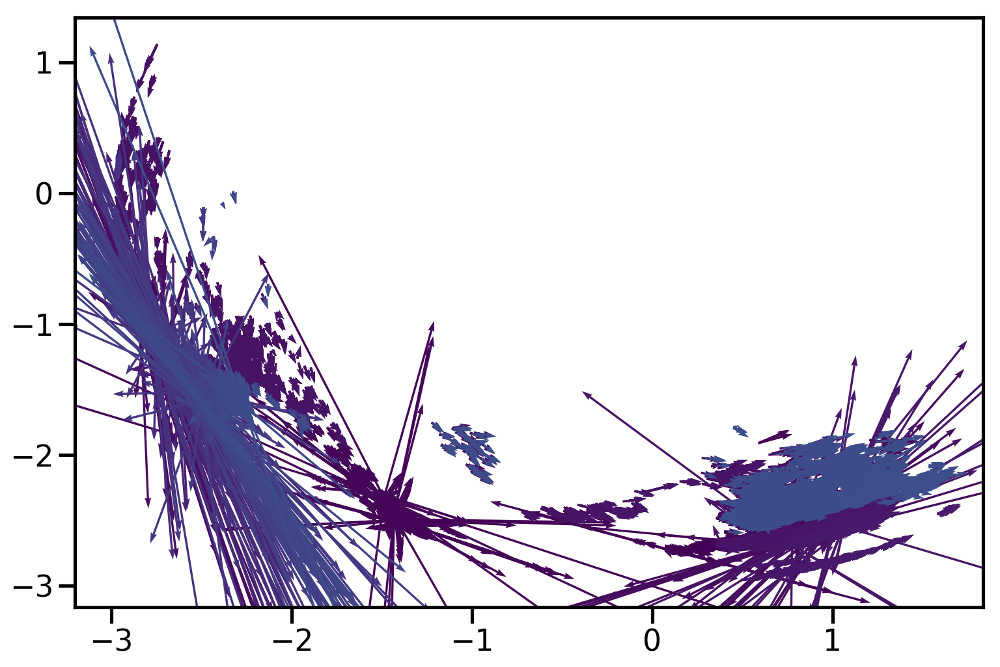

In [122]:
no=1000000
plt.figure(dpi=150,figsize=(12,8))
plt.quiver(xarrow[:no,0],xarrow[:no,1],varrow[:no,0],varrow[:no,1],range(no),scale=0.6)
#plt.xlim(0,0.25)
#plt.ylim(-1,-0.75)
plt.show()

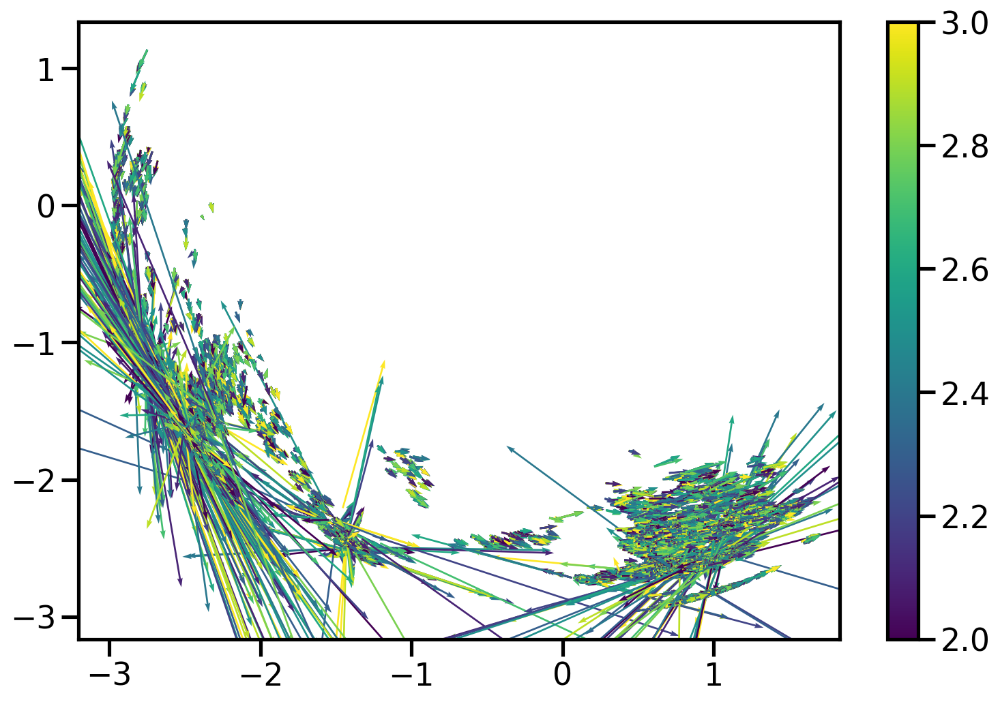

In [123]:
plt.figure(dpi=150,figsize=(12,8))
#plt.quiver(xp[:no,0],xp[:no,1],vp[:no,0],vp[:no,1],range(no),scale=0.6)
#plt.xlim(0,0.25)
# plt.xlim(-1.6,-1.2)
# plt.ylim(-2,-1.8)
plt.quiver(xp[:no,0],xp[:no,1],vp[:no,0],vp[:no,1],rall,scale=0.6)
plt.colorbar()
plt.show()

ValueError: 'c' argument has 1000000 elements, which is not acceptable for use with 'x' with size 235644, 'y' with size 235644.

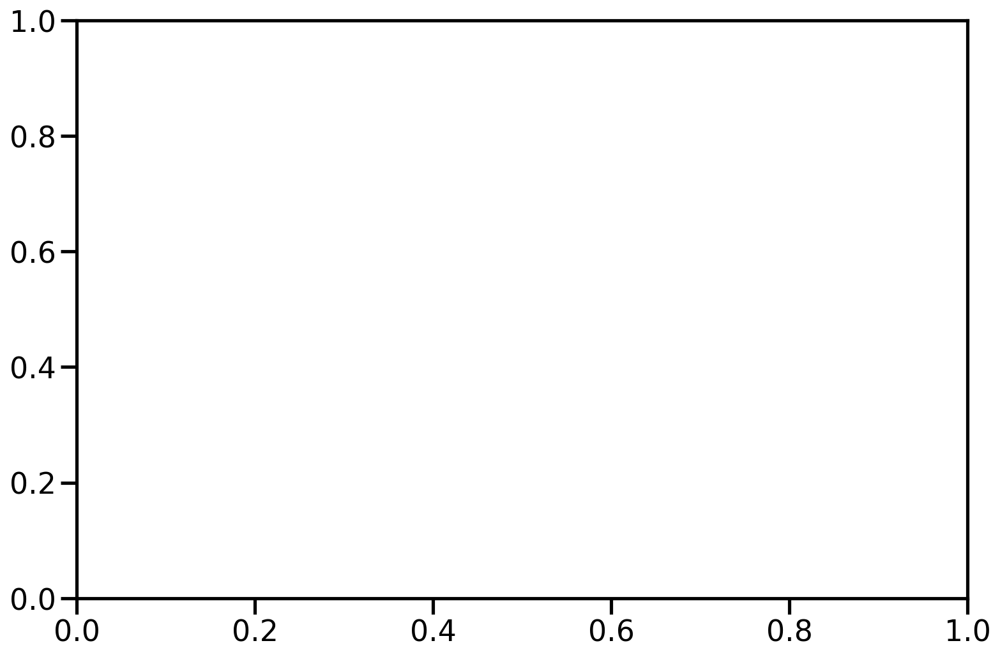

In [124]:
plt.figure(dpi=150,figsize=(12,8))
plt.scatter(xp[:no,0],xp[:no,1],c=range(no),s=0.3)
plt.show()

ValueError: 'c' argument has 11 elements, which is not acceptable for use with 'x' with size 1000, 'y' with size 1000.

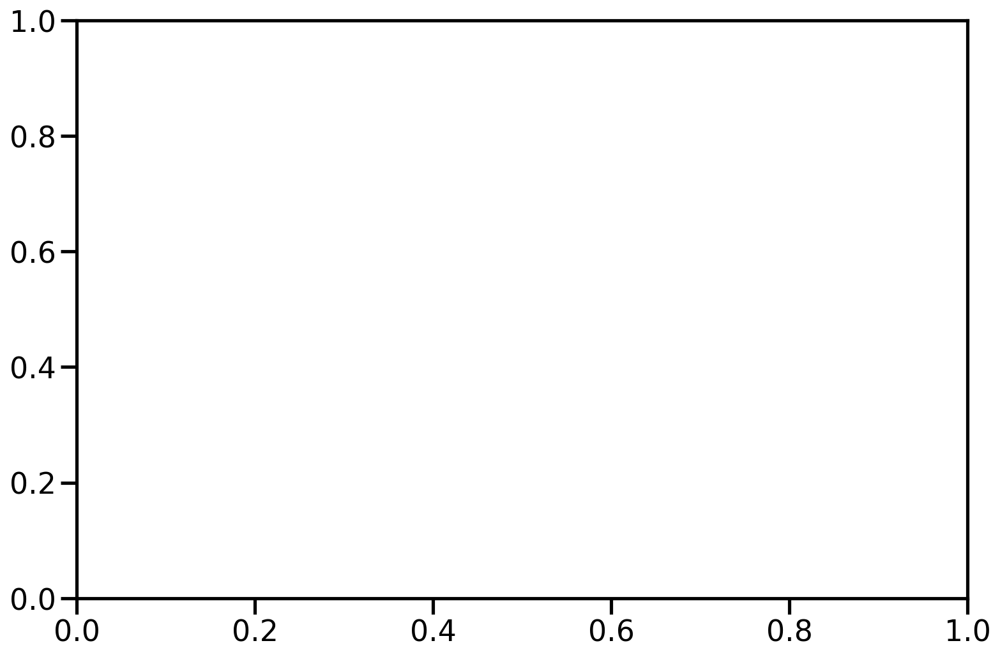

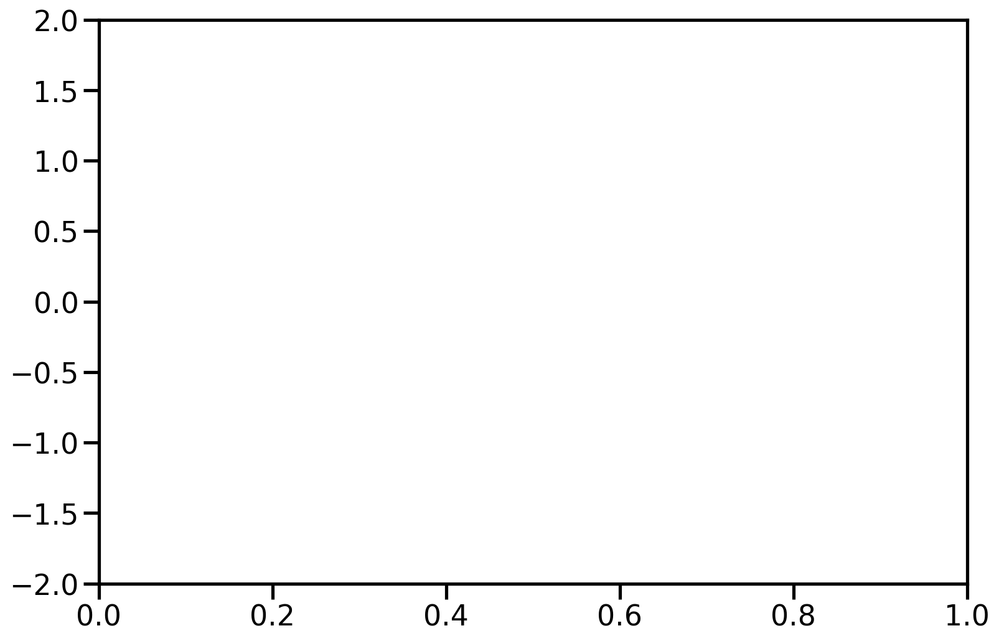

In [102]:
plt.figure(dpi=150,figsize=(12,8))
plt.scatter(xp[:no,0],xp[:no,2],c=range(no),s=0.3)
#plt.xlim(0,0.25)
plt.xlim(0,1)
plt.ylim(-2,2)
plt.show()

In [121]:
plot_positions3d(objids[:no,0],xp[:no,0], xp[:no,1], xp[:no,2],xlim=[-2,2],ylim=[-2.5,2])

In [79]:
dt=(tobs[:,1]-tobs[:,0])*24

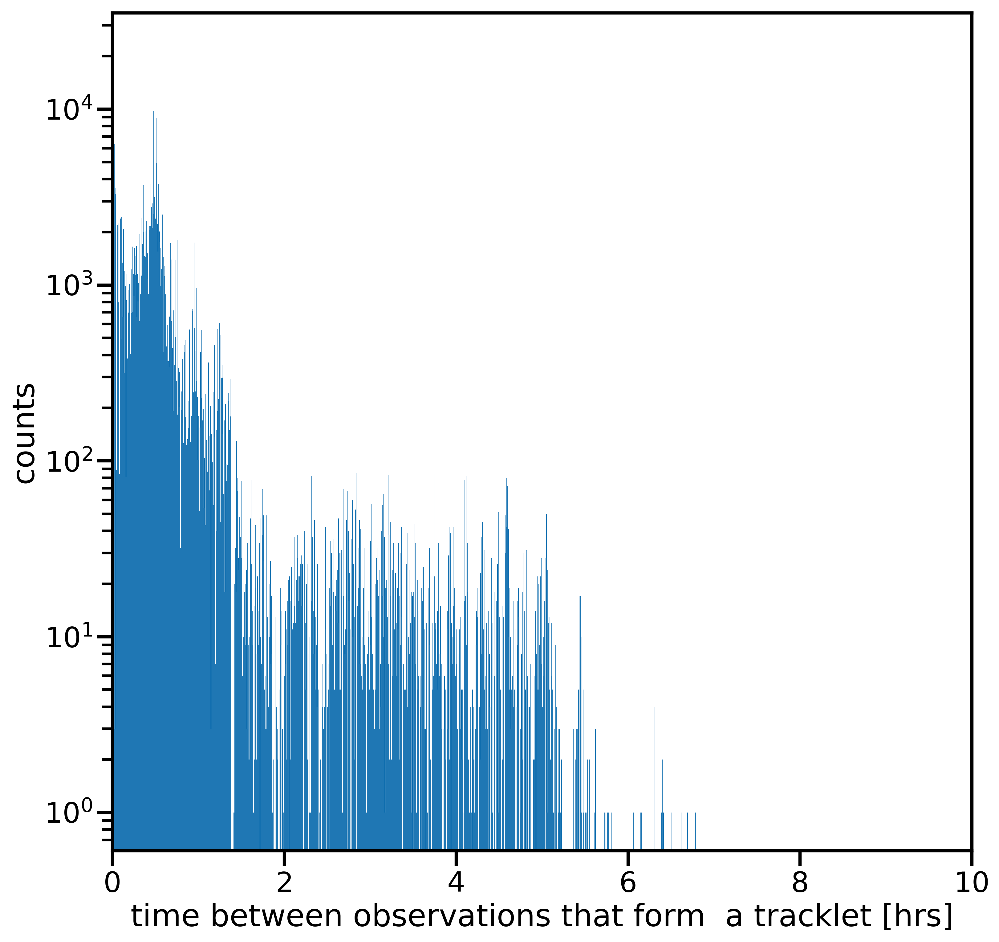

In [80]:
plt.figure(dpi=300,figsize=(12,12))
plt.xlabel('time between observations that form  a tracklet [hrs]')
plt.ylabel('counts')
plt.yscale('log')
plt.xlim(0,10)
plt.hist(dt,bins=1000)

plt.show()

In [81]:
#Plot selected observations
plt.figure(dpi=300,figsize=(12,12))

plt.scatter(dfobs['RA'].values[obsids],dfobs['DEC'].values[obsids],s=0.1,c=dfobs['objId'].values[obsids])
plt.xlabel('RA [deg]')
plt.ylabel('DEC [deg]')
plt.ylim(-45,-40)
plt.xlim(190,200)
plt.colorbar()
plt.show()

IndexError: index 430959 is out of bounds for axis 0 with size 163543

<Figure size 3600x3600 with 0 Axes>

In [ ]:
plot_positions3d(objids[:200000,0],xp[:200000,0], xp[:200000,1], xp[:200000,2],xlim=[-2,2],ylim=[-2,2])

In [ ]:
plot_positions3d(objids[:100000,0],vp[:100000,0], vp[:100000,1], vp[:100000,2],xlim=[-2,2],ylim=[-2,2])

### Now propagate the arrows to the same time (the center of the t array)

In [ ]:
[xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())

In [ ]:
df['time'].median()

In [ ]:
plot_positions3d(dt[:100000],xp[:100000,0], xp[:100000,1], xp[:100000,2],xlim=[-2,2],ylim=[-2,2])

### Let's cluster!

In [ ]:
#use astrometric uncertainty to determine clustering error (150mas (3sigma) )
astrometric_uncertainty=300/1000/3600/180*np.pi

# DBSCAN clustering parameters
eps=astrometric_uncertainty*r
eps=0.002
min_samples=3

In [ ]:
eps

In [ ]:
# Create 6D array of tracklets
# xpvp=np.hstack((xp,varrown))
xpvp=np.hstack((xp,vp/np.median(vp)))

In [ ]:
#Scale arrow speed to unit lenght to facilitate clustering in 6D space
# vn=np.linalg.norm(varrow,axis=1)
# varrown=[v/np.linalg.norm(v) for v in varrow]

Cluster in propagated position space (3D), Black dots are not clustered (garbage)

In [ ]:
plot_clusters3d(xp, [0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

Cluster in propagated position and velocity space (6D)


In [ ]:
# Heliocentric position space clustering
plot_clusters3d(xpvp,[0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

In [ ]:
# Velocity clustering
plot_clusters3d(xpvp,[3,4,5], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

## Try multiple heliocentric radii for clustering

In [ ]:
# range of radii
rall=np.arange(0.8,4,0.4)

# clustering radius for trackelt creation based on how far an object can move during one night 
dt=1
cr=50/150e6*86400*dt

# only one raidal velocity value [au/d]
drdt=0.001

# reference epoch for propagation
tref=df['time'].median()


xpall=[]
vpall=[]
dtall=[]

for r in rall:
    [xarrow, varrow, tarrow, goodpairs] = ls.create_heliocentric_arrows(df,r,drdt,tref,cr)
    [xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())
    
    xpall.append(xp)
    vpall.append(vp)
    dtall.append(dt)

Plot the propagated arrows as for each clustering radius. The red arrows show the actual states of the test asteroids. The blue circle represents the Earth's orbit.

In [ ]:
plt.figure(dpi=150,figsize=(12,12))

plt.scatter(0,0,s=4,c='r')
plt.xlabel('x [au]')
plt.ylabel('y [au]')

circle1=plt.Circle((0, 0), 1, color='b', fill=False)

#for i in range(len(rall)):   
plt.quiver(xp[i][:,0],xp[i][:,1],vp[i][:,0],vp[i][:,1],scale=0.7)


# for i in range(len(asteroids)):
#     plt.quiver(horizon_states[i][0][5],horizon_states[i][0][6],horizon_states[i][0][8],horizon_states[i][0][9],color='red')
    
plt.xlim(-4,4)
plt.ylim(-4,4)

plt.gcf().gca().add_artist(circle1)
plt.show()

In [ ]:
for i in range(len(rall)):  
    print('heliocentric distance sampled [au]:', rall[i])
    
    #use astrometric uncertainty to determine clustering error (150mas (3sigma) )
    astrometric_uncertainty=3*50/1000/3600/180*np.pi

    # DBSCAN clustering parameters
    eps=astrometric_uncertainty*rall[i]
    
    plot_clusters3d(xpall[i], [0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

### And in numbers ... 

In [ ]:
# r=2.6
# drdt=0.001
# tref=df['time'].median()
# cr=0.1

# #use astrometric uncertainty to determine clustering error (150mas (3sigma) )
# astrometric_uncertainty=3*50/1000/3600/180*np.pi

# # DBSCAN clustering parameters
# eps=astrometric_uncertainty*r

# [xarrow, varrow, tarrow, goodpairs] = ls.create_heliocentric_arrows(df,r,drdt,tref,cr)
# [xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())



In [ ]:
#use astrometric uncertainty to determine clustering error (150mas (3sigma) )
astrometric_uncertainty=300/1000/3600/180*np.pi

# DBSCAN clustering parameters
eps=astrometric_uncertainty*r
eps=0.003
min_samples=3

%%time
db=cluster.DBSCAN(eps=eps,min_samples=min_samples,n_jobs=4).fit(xp)

In [ ]:
%%time
db=cluster.DBSCAN(eps=eps,min_samples=min_samples,n_jobs=4).fit(xp)
# db=cluster.hdbscan.HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,
#     gen_min_span_tree=True, leaf_size=40, memory=Memory(cachedir=None),
#     metric='euclidean', min_cluster_size=3, min_samples=None, p=None, cluster_selection_epsilon=eps,cluster_selection_method='leaf').fit(xp)

In [ ]:
eps

In [ ]:
clusters=np.unique(db.labels_)

In [ ]:
goodpairs=obsids

In [ ]:
df=dfobs

In [ ]:
df;

In [ ]:
clusters

In [ ]:
#Calculate metrics
metric=metrics(dfobs,goodpairs,db)

In [ ]:
# Number of objects that ought to have been observed 
metric[0]

In [ ]:
# Number of clusters (including garbage), 
metric[1]

In [ ]:
# number of perfect clusters (all obs of a given obj in one cluster) 
metric[2]

In [ ]:
# number of pure clusters (obs of only one object in a cluster if not perfect)
metric[3]

In [ ]:
# number of impure clusters (obs of multiple objects in one cluster)
metric[4]

In [ ]:
#Completeness [%] (fraction of all observed objects that have been collected into clusters)
metric[5]

In [ ]:
#Missing objects
metric[6].compressed()

In [ ]:
# cluster labels: -1 is the garbage cluster
#metrics(df,goodpairs,db)[7]

### Observations in each arrow

In [ ]:
# Find observations in each arrow
dfoia=observations_in_arrows(dfobs,goodpairs,columns=['obs_t0','obs_t1'])

In [ ]:
# Find corresponding entry in obs database
dfobs.iloc[dfoia['obs_t0'][0]]

### Observations in each cluster

In [ ]:
#observations in each cluster
obs_in_cluster, labels = observations_in_cluster(dfobs,goodpairs,db)

In [ ]:
obs_in_cluster_df=pd.DataFrame(zip(labels,obs_in_cluster),columns=['clusterId','obsId'])

In [ ]:
obs_in_cluster_df

In [ ]:
obs2difi=df2difi(obs_in_cluster_df,'clusterId','obsId')

In [ ]:
obs2difi.to_csv('obs_per_cluster.csv',index=False)

### Objects in each cluster

In [ ]:
#object(s) in each cluster
obj_in_cluster, labels=objects_in_cluster(dfobs,objid,db)

In [ ]:
labels

In [ ]:
obj_in_cluster_df=pd.DataFrame(zip(labels,obj_in_cluster), columns=['clusterId','objId'])

In [ ]:
obj_in_cluster_df

In [ ]:
obj2difi=df2difi(obj_in_cluster_df,'clusterId','objId')

In [ ]:
obj2difi.to_csv('obj_per_cluster.csv',index=False)